In [1]:
from bs4 import BeautifulSoup as bs
import pandas as pd
import requests
from IPython.display import display, clear_output
import itertools
import pickle
import matplotlib.pyplot as plt
import numpy as np
import math
import networkx as nx
from time import sleep

In [2]:
url = 'https://rating.chgk.info/api/tournaments.json/?page={}'
df = pd.DataFrame(columns=['name', 'start'])
for i in range(1, 7):
    data = requests.get(url.format(i)).json()
    for item in data["items"]:
        df.loc[item["idtournament"]] = (item["name"], item["date_start"])
df.to_csv('tournaments.csv')

In [3]:
df = pd.read_csv('tournaments.csv').set_index('Unnamed: 0')
url = 'https://rating.chgk.info/api/tournaments/{}/recaps.json'
links = set()
for id in df.index:    
    teams = requests.get(url.format(id)).json()
    for team in teams:        
        t = team["recaps"]
        for i in range(len(t)):
            for j in range(i + 1, len(t)):
                first = int(t[i]["idplayer"])
                second = int(t[j]["idplayer"])
                if first < second:
                    links.add((first, second))
                else:
                    links.add((second, first))
    #побережём сайт рейтинга
    #sleep(1)
    clear_output(wait=True)
    display('Current tournament: ' + str(df.index.get_loc(id) + 1) + '/' + str(len(df)))
    display('Links total: ' + str(len(links)))

'Current tournament: 5332/5332'

'Links total: 1206230'

In [4]:
with open('links.pickle', 'wb') as f:
    pickle.dump(links, f)

In [5]:
with open('links.pickle', 'rb') as f:
    links = pickle.load(f)

In [6]:
players = itertools.chain(*links)
G = nx.Graph()
G.add_nodes_from(players)
for t in links:
    G.add_edge(*t)
print(nx.info(G))

Name: 
Type: Graph
Number of nodes: 198160
Number of edges: 1206230
Average degree:  12.1743


In [7]:
clusters_l = [len(c) for c in sorted(nx.connected_components(G), key=len, reverse=True)]
clusters_l[:11]

[145952, 153, 124, 74, 72, 56, 50, 47, 42, 40, 39]

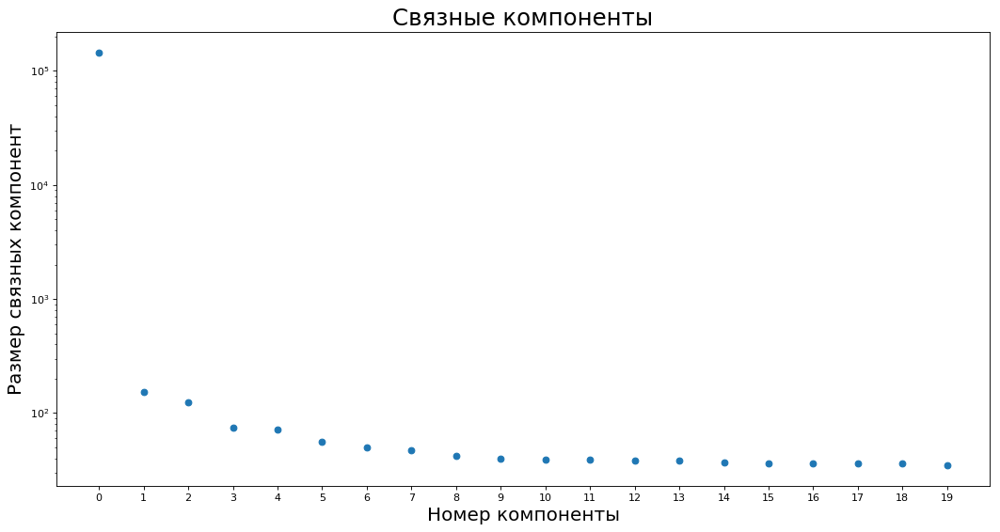

In [8]:
_count = 20
%matplotlib inline
plt.figure(figsize=(16, 8), dpi=80)
plt.scatter(range(_count), clusters_l[:_count])
plt.title("Связные компоненты", fontsize=22)
plt.xlabel("Номер компоненты", fontsize=18)
plt.xticks(range(_count))
plt.ylabel("Размер связных компонент", fontsize=18)
plt.yscale("log")
plt.show()

In [9]:
for i in range(1, 10):
    _g = list(sorted(nx.connected_components(G), key=len, reverse=True)[i]) 
    s = pd.Series()
    p_url = 'https://rating.chgk.info/api/players/{}/tournaments.json'
    t_url = 'https://rating.chgk.info/api/teams/{}.json'
    for player in _g:
        data = requests.get(p_url.format(player)).json()
        for item in data:
            team_id = data[item]["tournaments"][0]["idteam"]
        data = requests.get(t_url.format(team_id)).json()
        town = data[0]["town"]
        s.at[len(s)] = town
        #print(town)
    print('Кластер #{}'.format(i))
    print(s.value_counts())

Кластер #1
Керчь    153
dtype: int64
Кластер #2
Усть-Илимск    110
Владивосток     12
Иркутск          2
dtype: int64
Кластер #3
Тамбов        72
Люксембург     2
dtype: int64
Кластер #4
Лесной    72
dtype: int64
Кластер #5
Ейск    56
dtype: int64
Кластер #6
Бишкек    50
dtype: int64
Кластер #7
Горно-Алтайск    47
dtype: int64
Кластер #8
Житомир    37
Глазов      5
dtype: int64
Кластер #9
Горно-Алтайск    31
Москва            9
dtype: int64


In [10]:
subgraph_v = list(sorted(nx.connected_components(G), key=len, reverse=True)[0])
subgraph = G.subgraph(subgraph_v)
print(nx.info(subgraph))

Name: 
Type: Graph
Number of nodes: 145952
Number of edges: 1070698
Average degree:  14.6719


In [11]:
for t in sorted(G.degree, key=lambda x: x[1], reverse=True)[:10]:
    print('Игрок {} играл с {} игроками'.format(t[0], t[1]))

Игрок 42511 играл с 818 игроками
Игрок 15051 играл с 798 игроками
Игрок 29800 играл с 678 игроками
Игрок 23020 играл с 666 игроками
Игрок 16581 играл с 662 игроками
Игрок 5328 играл с 657 игроками
Игрок 29887 играл с 651 игроками
Игрок 15811 играл с 645 игроками
Игрок 30352 играл с 605 игроками
Игрок 1055 играл с 602 игроками


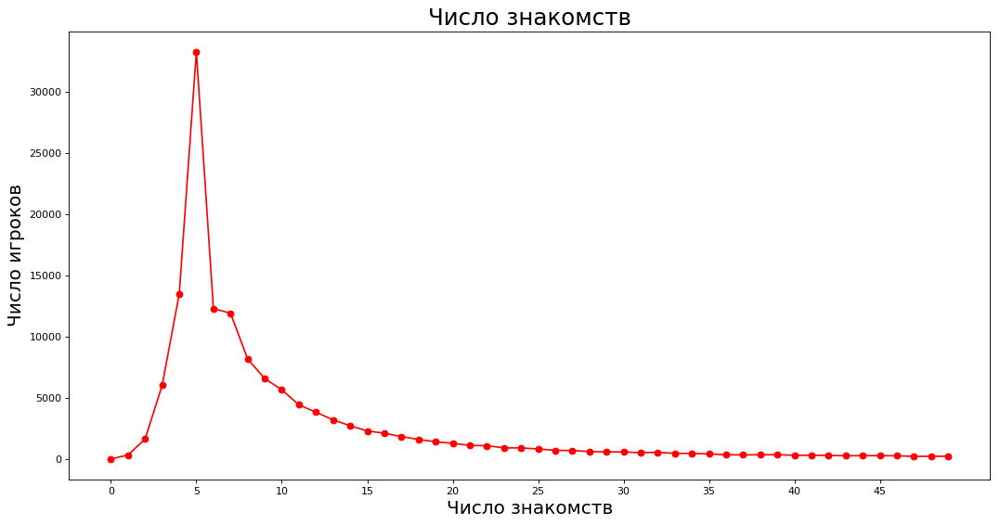

In [12]:
_count = 50
values = nx.degree_histogram(subgraph)
plt.figure(figsize=(16, 16), dpi=80)
plt.plot(range(_count),values[:_count],'ro-')
plt.xlabel('Число знакомств', fontsize=18)
plt.xticks(range(0,_count, 5))
plt.ylabel('Число игроков', fontsize=18)
plt.title('Число знакомств', fontsize=22)
plt.show()

In [13]:
_l = [values.index(_x) for _x in values for _y in range(_x)]
print(np.mean(_l),
np.median(_l))

14.20917150844113 7.0


In [14]:
famous_players = {9808: 'Александр Друзь',
                  5195: 'Анатолий Вассерман',
                  25882: 'Максим Поташев',
                  29333: 'Михаил Скипский',
                 118622: 'Михаил Атепаев',
                 42511: 'Николай Некрылов', 
                 15051: 'Георгий Коколия',
                 118621: 'Михаил Акулов'}
for key in famous_players:
    print('{}: {} - максимальное расстояние от игрока до других'
         .format(famous_players[key],
                 nx.eccentricity(subgraph, v=key)))

Александр Друзь: 12 - максимальное расстояние от игрока до других
Анатолий Вассерман: 12 - максимальное расстояние от игрока до других
Максим Поташев: 12 - максимальное расстояние от игрока до других
Михаил Скипский: 12 - максимальное расстояние от игрока до других
Михаил Атепаев: 13 - максимальное расстояние от игрока до других
Николай Некрылов: 12 - максимальное расстояние от игрока до других
Георгий Коколия: 13 - максимальное расстояние от игрока до других
Михаил Акулов: 13 - максимальное расстояние от игрока до других


In [15]:
for key in famous_players:
    paths =  nx.shortest_path_length(subgraph, source=key).values()
    print('{}: {} - среднее расстояние от игрока до других'
         .format(famous_players[key],
                sum(paths) / len(paths)))

Александр Друзь: 3.941706862530147 - среднее расстояние от игрока до других
Анатолий Вассерман: 3.7972758167068625 - среднее расстояние от игрока до других
Максим Поташев: 3.8936979280859463 - среднее расстояние от игрока до других
Михаил Скипский: 3.863783983775488 - среднее расстояние от игрока до других
Михаил Атепаев: 4.144369381714537 - среднее расстояние от игрока до других
Николай Некрылов: 3.5755385332164 - среднее расстояние от игрока до других
Георгий Коколия: 3.608837151940364 - среднее расстояние от игрока до других
Михаил Акулов: 4.56415807936856 - среднее расстояние от игрока до других


[1, 157, 6627, 45747, 58396, 24361, 7302, 2194, 658, 315, 147, 44, 3, 0, 0]


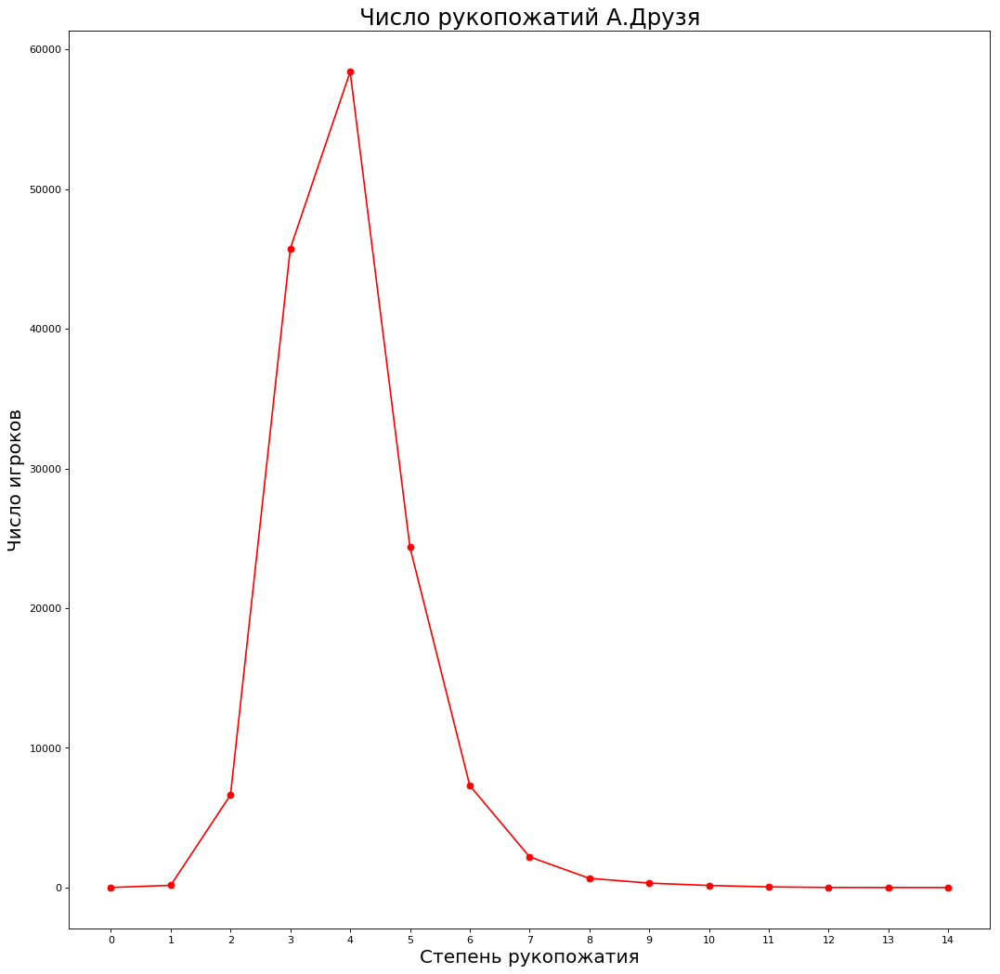

In [16]:
paths =  nx.shortest_path_length(subgraph, source=9808)
neighbours = [0] * 15
for k in paths:
    neighbours[paths[k]] += 1
print(neighbours)
_count = 15
plt.figure(figsize=(16, 16), dpi=80)
plt.plot(range(_count),neighbours[:_count],'ro-') # in-degree
plt.xlabel('Степень рукопожатия', fontsize=18)
plt.xticks(range(_count))
plt.ylabel('Число игроков', fontsize=18)
plt.title('Число рукопожатий А.Друзя', fontsize=22)
plt.show()

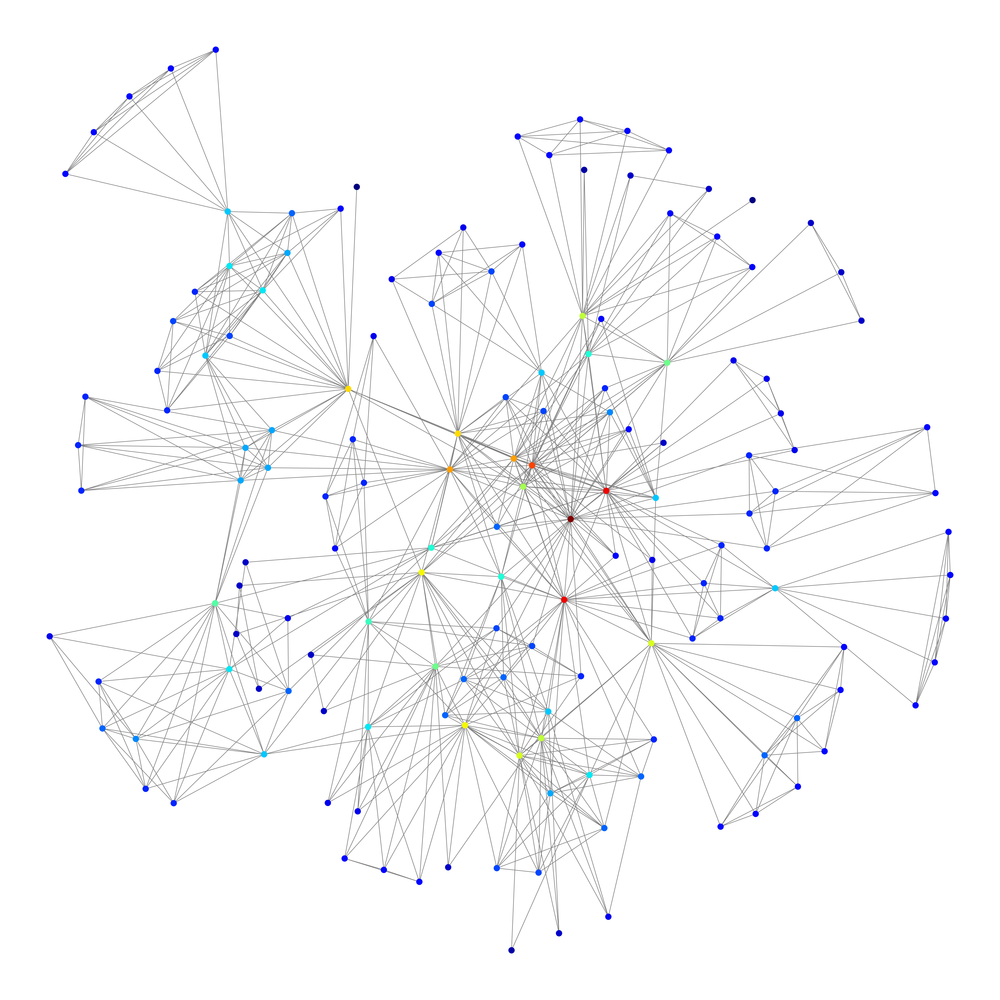

In [17]:
little_v = list(sorted(nx.connected_components(G), key=len, reverse=True)[1])
little = G.subgraph(little_v)

plt.figure(figsize=(24, 24), dpi=200)
pos = nx.kamada_kawai_layout(little)
nx.draw(little, pos=pos, node_size=100, edge_color='gray',
       node_color=[val for (node, val) in little.degree()], cmap=plt.cm.jet)
plt.show()

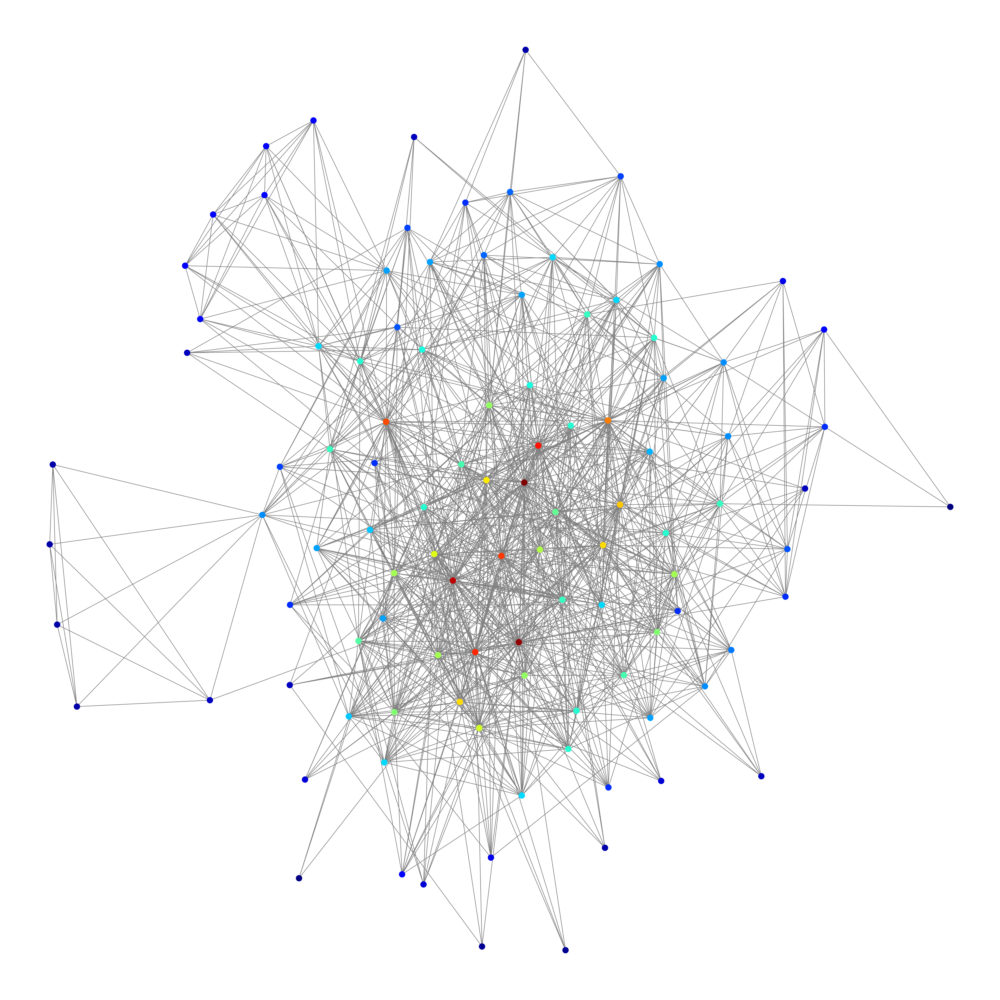

In [18]:
id = 118622
ego_graph = [n for n in G.neighbors(id)]
#ego_graph.append(id)
ego_graph = G.subgraph(ego_graph)

plt.figure(figsize=(24, 24), dpi=200)
pos = nx.kamada_kawai_layout(ego_graph)
nx.draw(ego_graph, pos=pos, node_size=100, edge_color='gray',
       node_color=[val for (node, val) in ego_graph.degree()], cmap=plt.cm.jet)
plt.show()